In [1]:
import time
from datetime import datetime
import csv
import pandas as pd
import numpy as np
import random as rd
import os
import itertools
import matplotlib.pyplot as plt
from matplotlib.dates import DateFormatter
import requests
import xml.etree.ElementTree as ET
import certifi
# import seaborn as sns
from fetch_api import entsoe_api, energinet_api



In [2]:

key_entso = '077d7e61-14ac-4a16-9fa6-f0be98f08a8e'


In [3]:
def generate_date_range(day):
    """
    Issue with ENTSO-E data: data for the last minute of the day is missing (between 23:59 and 00:00)
    """
    end = (datetime.strptime(day, '%Y%m%d') + pd.Timedelta(days=1)).strftime('%Y%m%d')
    dates0 = pd.date_range(start=day, end = end, freq = '4S', inclusive = 'left')
    dates = [(d - pd.Timedelta(minutes=1) if d.hour == 23 and d.minute == 59 else d) for d in dates0]
    dates = pd.DatetimeIndex(dates)
    new_dates = dates.drop_duplicates()
    return new_dates

def get_entso_response_root(day, key_entso, area_code):
    response = requests.get(url = "https://web-api.tp.entsoe.eu/api?securityToken=" + key_entso + "&documentType=A84&processtype=A67&businessType=A96&controlArea_Domain=" + area_code + "&periodStart=" + day + "0000&periodEnd=" + day + "2359")
    root = ET.fromstring(response.text)
    return root

def process_root(day, key_entso,area_code):
    root = get_entso_response_root(day, key_entso,area_code)
    dates = generate_date_range(day)
    data_up = []
    data_down = []
    # Loop through TimeSeries elements
    for ts in root.findall(".//{urn:iec62325.351:tc57wg16:451-6:balancingdocument:4:1}TimeSeries"):
        mRID = ts.find(".//{urn:iec62325.351:tc57wg16:451-6:balancingdocument:4:1}mRID").text

        # Extract Points within each TimeSeries
        for point in ts.findall(".//{urn:iec62325.351:tc57wg16:451-6:balancingdocument:4:1}Point"):
            position = int(point.find(".//{urn:iec62325.351:tc57wg16:451-6:balancingdocument:4:1}position").text)
            if point.find(".//{urn:iec62325.351:tc57wg16:451-6:balancingdocument:4:1}activation_Price.amount") == None:
                price=100000
            else:
                price = float(point.find(".//{urn:iec62325.351:tc57wg16:451-6:balancingdocument:4:1}activation_Price.amount").text)

            # Append data based on mRID (1 for up, 2 for down)
            if mRID == '1':
                data_up.append({'position': position, 'activation_Price_up': price})
            elif mRID == '2':
                data_down.append({'position': position, 'activation_Price_down': price})

    # Convert lists to DataFrames
    df_up = pd.DataFrame(data_up).set_index('position')
    df_down = pd.DataFrame(data_down).set_index('position')

    # Merge the DataFrames
    df = pd.merge(df_up, df_down, how = 'outer', left_index = True, right_index = True)
    index_all = range(int((24*60*60-60)/4)) ## if the data is for one day
    df = df.reindex(index_all)
    df = df.ffill()

    df.index= dates
    df['MTU'] = df.index.floor('15T')
    df['MTU_time'] = df['MTU'].apply(lambda x: x.replace(year=2024, month=1, day=1))
    return df

def merge_all(week, key_entso,area_code):
    N_days = len(week)
    df = pd.DataFrame()
    for i in range(N_days):
        day = week[i]
        day_str = day.strftime('%Y%m%d')
        df_new = process_root(day_str, key_entso, area_code)
        df = pd.concat([df, df_new], axis = 0)
    df = df.replace(to_replace=100000, value = np.nan)
    df['activation_Price_down'] = -df['activation_Price_down']
    return df


today = datetime.today()
today = today.replace(hour=0, minute=0, second=0, microsecond=0)
print('Today:', today.date())

start_str = '20250125'
end_str = '20250131'
start_dt = datetime.strptime(start_str,'%Y%m%d')
end_dt = datetime.strptime(end_str,'%Y%m%d')
dt = '1D'
week = pd.date_range(start = start_str, end = end_str, freq = dt) # periods = number of weeks to analyse
print('Market analysis from:', week[0].date(), 'to', week[-1].date())

area = 'DK1' # 'DK2'
print('Analysis for area:', area)

all_area_code = {'DE': '10Y1001A1001A82H', 'DK2': '10YDK-2--------M', 'DK1': '10YDK-1--------W'}
area_entso = all_area_code[area]

df = merge_all(week, key_entso, area_code = all_area_code[area])


Today: 2025-03-07
Market analysis from: 2025-01-25 to 2025-01-31
Analysis for area: DK1


C:\Users\manis\AppData\Local\Temp\ipykernel_26356\1995109534.py:6: FutureWarning: 'S' is deprecated and will be removed in a future version, please use 's' instead.
  dates0 = pd.date_range(start=day, end = end, freq = '4S', inclusive = 'left')
C:\Users\manis\AppData\Local\Temp\ipykernel_26356\1995109534.py:51: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  df['MTU'] = df.index.floor('15T')
C:\Users\manis\AppData\Local\Temp\ipykernel_26356\1995109534.py:6: FutureWarning: 'S' is deprecated and will be removed in a future version, please use 's' instead.
  dates0 = pd.date_range(start=day, end = end, freq = '4S', inclusive = 'left')
C:\Users\manis\AppData\Local\Temp\ipykernel_26356\1995109534.py:51: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  df['MTU'] = df.index.floor('15T')
C:\Users\manis\AppData\Local\Temp\ipykernel_26356\1995109534.py:6: FutureWarning: 'S' is deprecated an

In [5]:
start_date = '2025-01-25'
end_date = '2025-01-31'
powersystemrightnow = energinet_api('PowerSystemRightNow', start_date, end_date)
if powersystemrightnow.empty:
    print(f'No data from this period {start_date} to {end_date}')
else:
    powersystemrightnow = powersystemrightnow[['Minutes1UTC','aFRR_ActivatedDK1']]
    powersystemrightnow['Minutes1UTC'] = pd.to_datetime(powersystemrightnow['Minutes1UTC'])
    powersystemrightnow = powersystemrightnow.set_index('Minutes1UTC')

In [8]:
powersystemrightnow = powersystemrightnow.resample('4s').mean().ffill()

In [6]:
df = df.resample('4s').mean()

In [9]:
from darts import TimeSeries
from darts.dataprocessing import Pipeline
from darts.dataprocessing.transformers import MissingValuesFiller, Scaler

In [10]:
aFRR_energy_UP = df['activation_Price_up'] 

In [11]:
aFRR_energy_UP_ts = TimeSeries.from_series(aFRR_energy_UP, freq = '4s')

In [12]:
powersystemrightnow_ts = TimeSeries.from_series(powersystemrightnow['aFRR_ActivatedDK1'], freq = '4s')

In [13]:
scaler_ts = Scaler()
filler_ts = MissingValuesFiller(fill = 0.0)

In [15]:
pipeline = Pipeline([MissingValuesFiller(), Scaler()])

In [16]:
aFRR_energy_UP_ts_filled = filler_ts.transform(aFRR_energy_UP_ts)

In [17]:
aFRR_energy_UP_ts_scl = scaler_ts.fit_transform(aFRR_energy_UP_ts_filled)

In [ ]:
activation_qty_ts_scl = pipeline.fit_transform(powersystemrightnow_ts) # covariance

In [21]:
train_start = '2025-01-25 00:00:00'
test_start = '2025-01-27 00:00:00'
test_end = '2025-01-31 23:58:56'


In [22]:
if isinstance(train_start, str):
    train_start = pd.Timestamp(train_start)
if isinstance(test_start, str):
    test_start = pd.Timestamp(test_start)
if isinstance(test_end, str):
    test_end = pd.Timestamp(test_end)

# Split target series
aFRR_energy_UP_ts_scl_train = aFRR_energy_UP_ts_scl[train_start : test_start - aFRR_energy_UP_ts_scl.freq]
aFRR_energy_UP_ts_scl_test = aFRR_energy_UP_ts_scl[test_start : test_end]

In [24]:
from darts.models import RegressionModel, LinearRegressionModel
from sklearn.linear_model import QuantileRegressor

c:\Users\manis\anaconda3\envs\opt_env\Lib\site-packages\statsforecast\utils.py:237: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  "ds": pd.date_range(start="1949-01-01", periods=len(AirPassengers), freq="M"),


In [ ]:
"""
target = aFRR_energy_UP_ts_scl_train
future_covariate = activation_qty_ts_scl
"""

In [28]:
lr_model = LinearRegressionModel(
    output_chunk_length=  48,
    lags = list(range(-1, -3, -1)),
    lags_future_covariates = list(range(-1, -3, -1)),
)
 
lr_model.fit(aFRR_energy_UP_ts_scl_train, future_covariates = activation_qty_ts_scl)

LinearRegressionModel(lags=[-1, -2], lags_past_covariates=None, lags_future_covariates=[-1, -2], output_chunk_length=48, output_chunk_shift=0, add_encoders=None, likelihood=None, quantiles=None, random_state=None, multi_models=True, use_static_covariates=True)

In [17]:
# lr_quantile_models = {}
# quantiles = [0.5]
# for q in quantiles:
#     quantile_regressor = QuantileRegressor(
#         alpha = 0,
#         quantile = q,
#         solver = 'highs'
#     )

#     lr_quantile_models[q] = RegressionModel(
#         output_chunk_length=  48,
#         lags = list(range(-1, -2, -1)),
#         model = quantile_regressor
#     )

#     lr_quantile_models[q].fit(aFRR_energy_UP_ts_scl_train)

In [29]:
from darts.timeseries import concatenate
gp_backtest_forecasts = lr_model.historical_forecasts(
    series=concatenate([aFRR_energy_UP_ts_scl_train, aFRR_energy_UP_ts_scl_test], axis=0),
    # future_covariates =concatenate([exog_ts_scl_train, exog_ts_scl_test], axis=0),
    future_covariates = activation_qty_ts_scl,
    start=1,  
    forecast_horizon=900,
    enable_optimization=False,
    num_samples=1,
    predict_likelihood_parameters=False,    
    stride=900,
    retrain=False,
    last_points_only=False,
    verbose=True
)

`start` position `1` corresponding to time `2025-01-25 00:00:04` is before the first predictable/trainable historical forecasting point for series at index: 0. Using the first historical forecasting point `2025-01-25 01:00:04` that lies a round-multiple of `stride=900` ahead of `start`. To hide these warnings, set `show_warnings=False`.


historical forecasts:   0%|          | 0/142 [00:00<?, ?it/s]

<Axes: xlabel='time'>

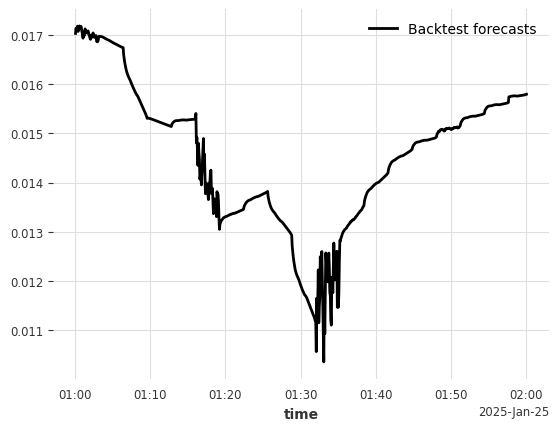

In [41]:
gp_backtest_forecasts[0].plot(label='Backtest forecasts')
# aFRR_energy_UP_ts_scl_train.plot(label='Actual')

In [42]:
len(gp_backtest_forecasts)

142

In [43]:
gp_backtest_forecasts_df = pd.DataFrame()
for idx, forecast in enumerate(gp_backtest_forecasts):
    forecast_df = forecast.pd_dataframe()
    forecast_df['idx'] = idx
    gp_backtest_forecasts_df = pd.concat([gp_backtest_forecasts_df, forecast_df])
# aFRR_energy_UP_ts_scl_test.plot(label="Actual")

In [44]:
gp_backtest_forecasts_df['Actual Price UP'] = concatenate([aFRR_energy_UP_ts_scl_train, aFRR_energy_UP_ts_scl_test], axis=0).pd_dataframe()

In [45]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [47]:
import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Scatter(
    x=gp_backtest_forecasts_df.index, 
    y=gp_backtest_forecasts_df['activation_Price_up'], 
    mode='lines', 
    name='Activation Price Up'
))

fig.add_trace(go.Scatter(
    x=gp_backtest_forecasts_df.index, 
    y=gp_backtest_forecasts_df['Actual Price UP'], 
    mode='lines', 
    name='Actual Price UP'
))

fig.update_layout(
    title='Time vs Activation Price Up & Actual Price Up',
    xaxis_title='Time',
    yaxis_title='Price (EUR/MWh)',
    legend_title='Legend',
    template='plotly_white'
)

fig.show()
